# YOLO 深度學習物件偵測
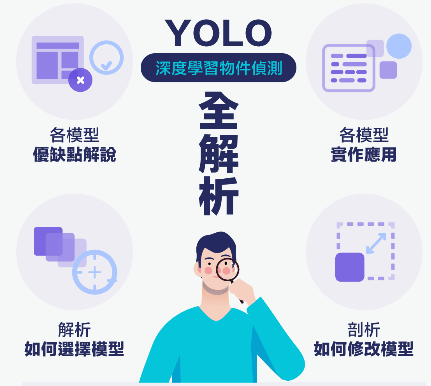
* 課程重點
 ✔ 物件偵測與物件偵測資料集          
 ✔ 計算物件偵測最重要的指標-Average Precision
 ✔ 依照應用需求來選擇一種最佳的模型    
 ✔ 有系統的調整超參數以提升辨識率 
 ✔ 比較不同模型在同一個資料集上的辨識率差距        
 ✔ 修改模型以達成在客製化不同資料集上的訓練      
 ✔ 透過Optuna最佳化模型的超參數運用
 ✔ 修改模型以達到Multi-label的物件偵測 
 ✔ 透過自動化調整超參數來顯著提升辨識率
 * PyTroch  ×  YOLO物件偵測實作 
 * 五個常見的面試和實作問題相對應的學習對應提供給你參考，讓你的學習更有效率
 1. OLOv1無法偵測重心在同一個grid cell的不同類物體，但YOLOv2可以
 單元三：運用YOLOv1實現口罩偵測應用 單元四：運用YOLOv2實現偵測複數個形心位置相同的物體
 2. YOLOv3可以實現單一物體多類別的偵測與辨識 單元五：運用YOLOv3實現Muti-Label物件偵測模型
 3. YOLOv4使用了哪些trick，使得mAP大幅提升 單元六：運用YOLOv4在醫學影像，並學會如何最佳化超參數
 4. YOLOX的Decoupled head對辨識率的影響有多大 單元八：比較YOLOX與其它模型的優勢
 5. YOLOv5與YOLOX或YOLOv7的優勢分別在什麼地方 單元七：運用YOLOv5整合複數個模型的偵測結果以提升辨識率 單元九：2022最新！YOLOv7解析、應用實作

##### CH01 物件偵測
1. 重要指標 : Average Precision
2. No-Maximal-Suppression
3. 什麼是物件偵測: 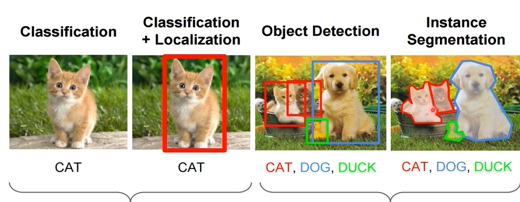
4. 影像分割，分為 S
* Semantic(語意) Segmentation : 可分類，但是無法區分一個一個的物件
* instance Segmentation : 可以分出物件，先object detection，再語意分割
* Panoptic[pænˋɑptɪk]全景 Segmentation = Semantic(語意) Segmentation (路面，建築物，天空)+ instance Segmentation (汽車，人，物件)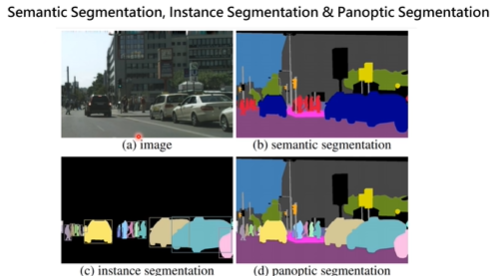

#### 2-2. 物件偵測資料集: 
*  PASCAL VOC 2007 dataset
(1) 9963 images: 5000 test images , 2000 training images，  (2) 24640 annotated objects (3)attributes屬性 including 'difficult' <br>
(4) 20 classes including aeroplane, bicycle, boat, bottle, bus, car, ...e.t.c <br>
(5) Main challenge tasks including classification and detection
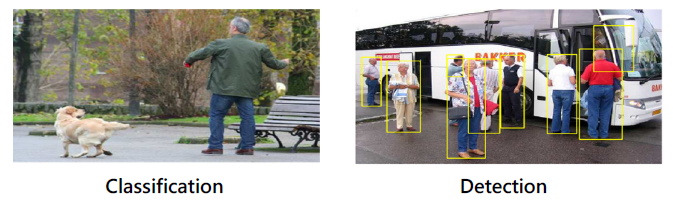
* PASCAL VOC 2012 dataset
(1) 11530 images (2) 27450 annotated objects (3)attributes屬性 including 'difficult'<br>
(4) 20 classes including aeroplane, bicycle, boat, bottle, bus, car, ...e.t.c <br>
(5) Main challenge tasks including classification , detection & segmentation
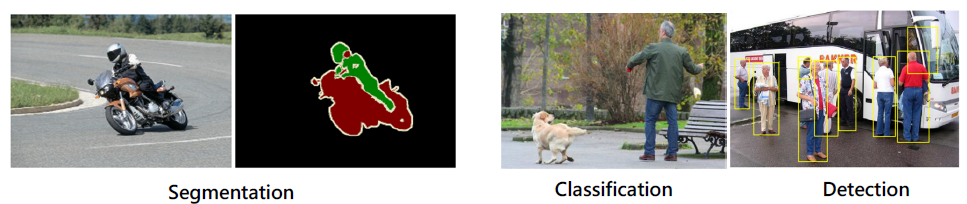
* KITTI dataset : 第一個用在自駕車的資料集
(1) 7481 training images & 7518 test images
(2) 80256 labeled objects
(3) Object difficulties are defined as
1. Easy : Min. bounging box height: 40 Px,Max. occlussion level(被擋住):Fully visible, Max. truncation(沒照到車子的比例): 15%
2. Moderate : Min. bounging box height: 25 Px,Max. occlussion level:partly occluded部分遮擋  Max. truncation: 30%
3. Hard:Min. bounging box height: 25 Px,Max. occlussion level:Difficult to see. Max. truncation: 50%
(4) Including vehicle /ˈviː.ə.kl/車輛 viewed from different perspective[pɚˋspɛktɪv]遠景
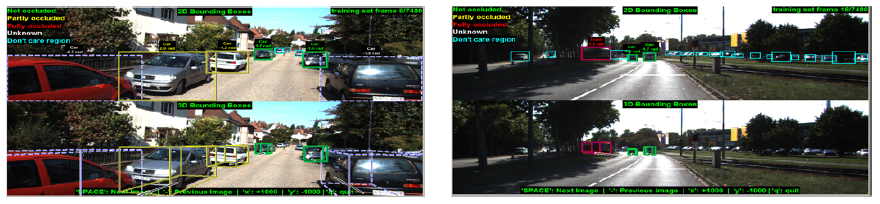
* MSCOCO dataset: (1) is a large-scale object detection, segmentation, and captioning (標題化Images )dataset. For the detection part: train/val/test: 82783/40504/40775 images 。 classes: 80
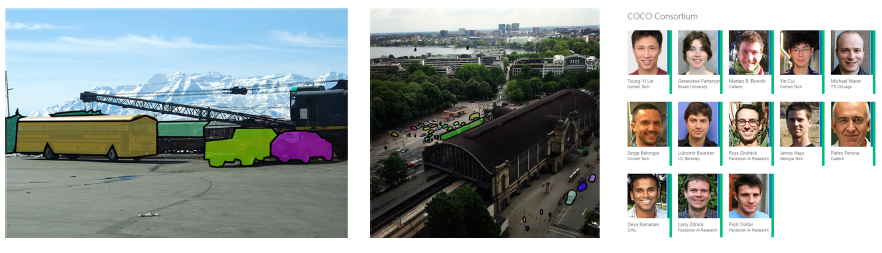
* Cityscapes dataset: 30 classes， 50 cities, 5000 annotated images with fine精細 annotations, 20000 annotated images with coarse粗略 annotation
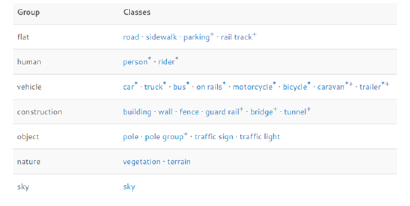
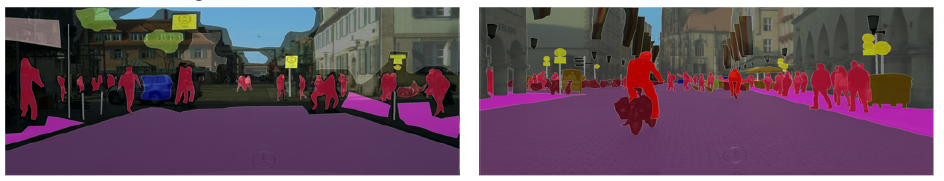
1. 右邊的邊緣有白線，表示每個物件都區分出來，是fine annotation for instance Segmentation
2. 左邊是coarse粗略 annotation ，is Semantic  Segmentation

* The EuroCity Persons Dataset: (從車子內照出來的image)
    1. 31 cities of 12 European countries
    2. Over 238200 preson instances實例 manually labeled in over 47300 images
    3. nearly one order of magnitude larger than person datasets used previously of benchmarking
    4. contains a large number of person orientation定位 annotation(over 211200)viewed from different perspective.遠景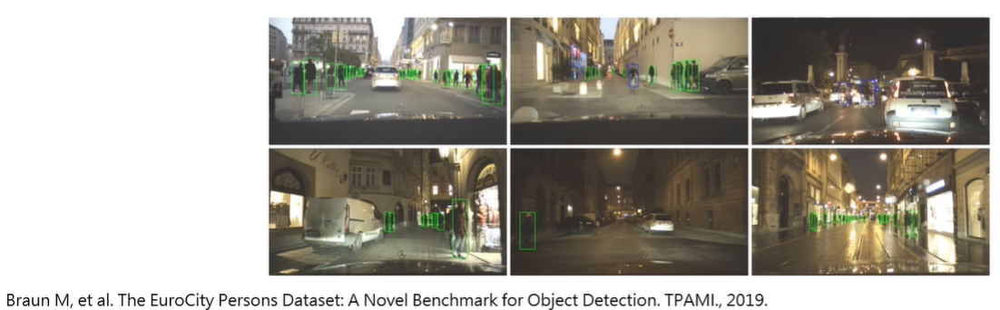
    比較error ，越小越好，先用比較多&廣大範圍的dataset train,再用小的&區域的dataset train 效果較好
    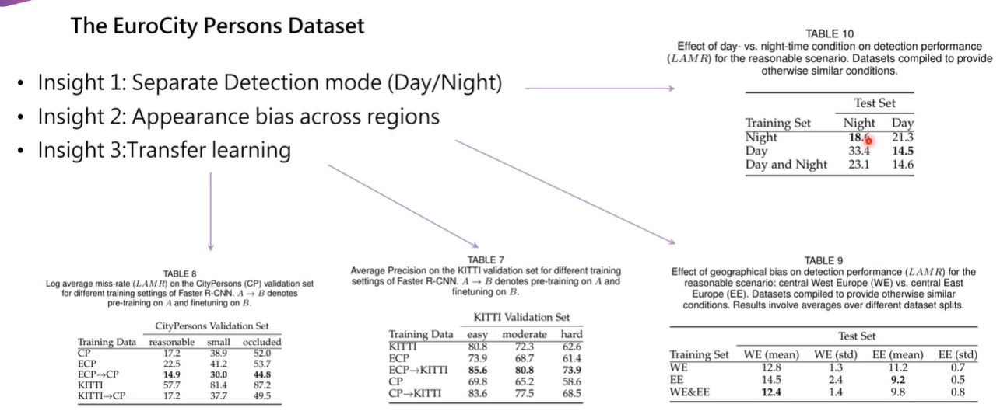

* BDD 100k : A Large-scale大規模 Driving Video Database
    1. consists of 100,000 videos
    2. Each video is about 40 seconds long, 720p and 30 fps
    3. wirh GPS/IMU information recorded by cell-phones to show roung driving trajectories軌跡
    4. drivers location in the United States under different weather conditions,incuding sunny, overcast, and rainy , at daytime or nighttime.
    5. labeled at several levels: image tagging, road object bounding boxes, drivable areas, lane makrings and full-frame instance全幀實例 segmentation
    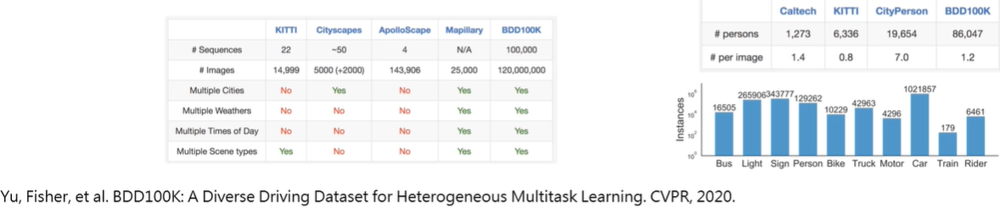
    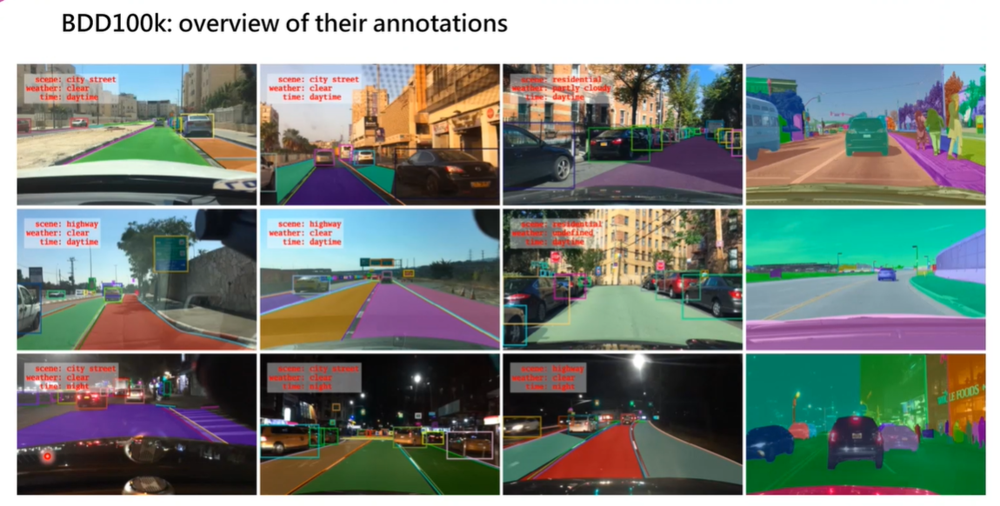

#### 2-3 如何計算物件偵測最重要的指標(Average Precision)平均精准度
* Quantitative[ˋkwɑntə͵tetɪv]定量 Metrics指標:predicted 預測，Precision 精確 
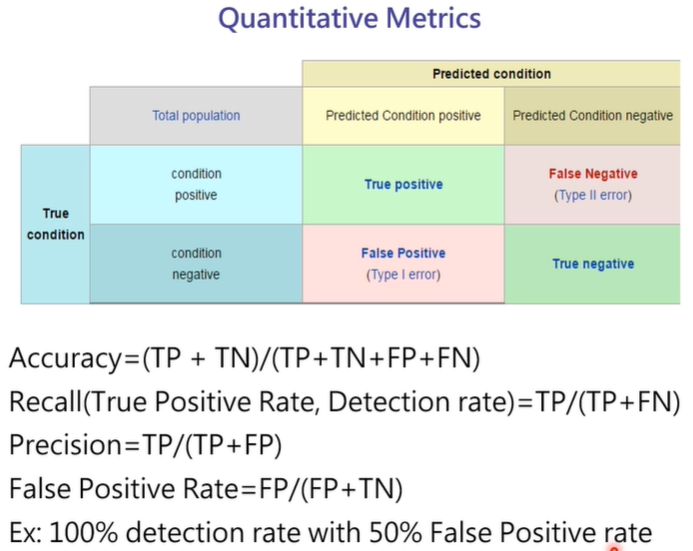
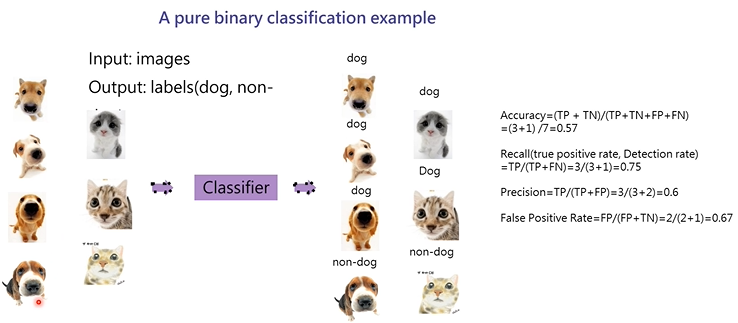
(1) Accuracy : 全部判正確的/全部
(2) Recall : 全部是狗的正確比例
(3) Precision : 全部被判成狗的，正確的比例

* How could we apply binary classification onto detection
(1) The production of the following bounding boxes are called Hypothesis Generation
(2) Alternatively或 , such bounding boxes are also called region proposals.
(3) HG is highly domain-specific.
(4) For example, vehicle車輛 candidates候選人 are not possibly in the sky.(不用detect sky 節省運算量)
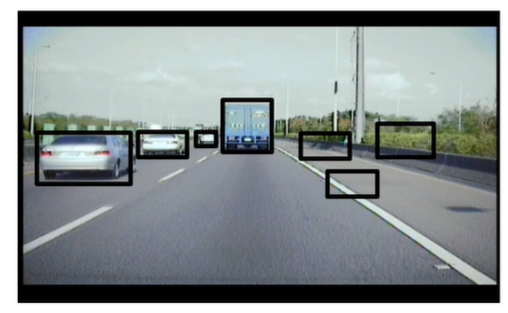

* Example for Vehical Detection:
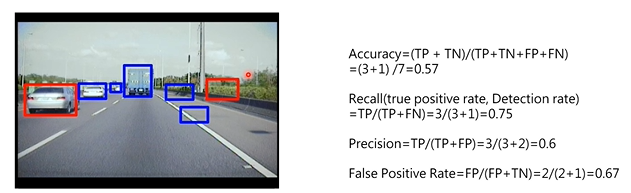
(1) Blue region: vehicle  :    such analysis is kind of impractical[ɪmˋpræktɪk!]不切實際的! Why?<br>
(2) red region: non-vehicle: non-vehicle(TN) is not the outcome of the final result!
* Example for vehicle detection : in reality<br>
(1) The final result only shows FP+TP because the production of region proposals is in the "black box"<br>
(2) The comparison對照 between the detection result and the Ground-truth基本事實 help to distinguish FP+TP from the results.<br>
(3) FN are those ground-truch labels not detected. <br>
(4) 實際上不會標示 TN,所以有TN 項的式子，不能拿來計算
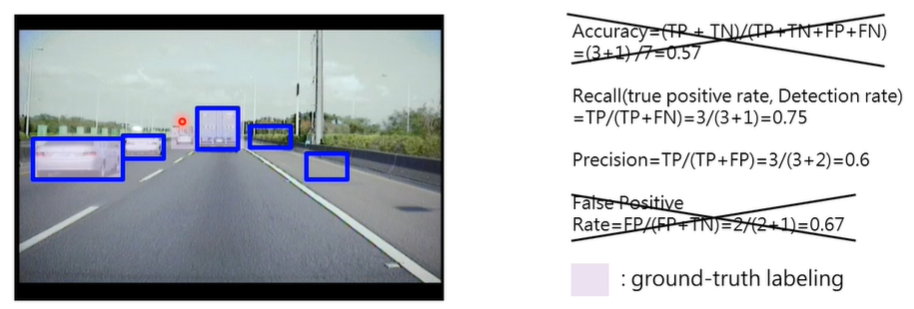

* 不是我們要的
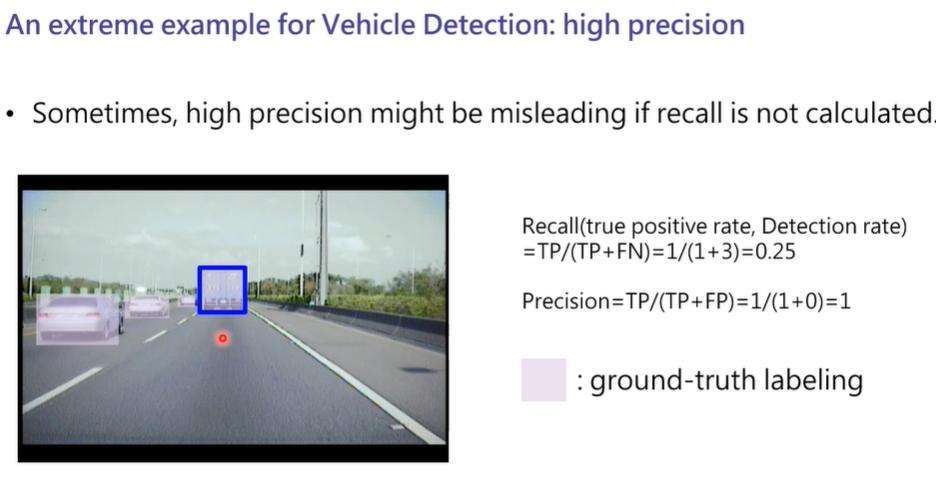
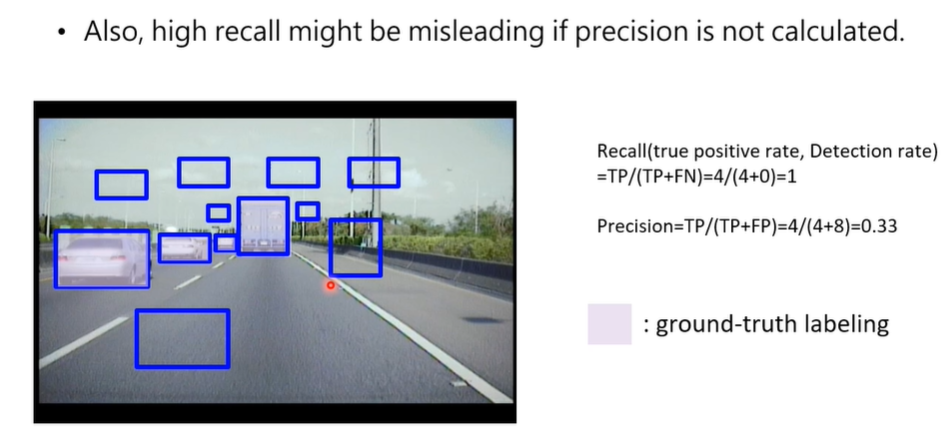
* 必須同時考慮 Recall & Precision

* Quantitative定量的 Result Analysis in term of "Confidence"信心
<br> Confidence : 機器學習的輸出介於0 ~1 之間，稱Confidence
1. Do objects with higher confidence tend to傾向, 易於 be more correct? 
Ans: Not exactly!不完全是
2. Do we expect most detection error coming from low confidence?
Ans: Yes
3.Do the above metrics reflect errors in high/low confidence?
Ans: No!
4. is there any metrics to assess評價 the detection results with confidence?
Ans: Yes, It is called Average Precision(AP) 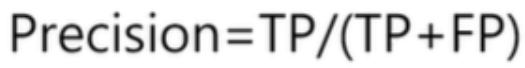
* Average Precision : 同時考慮Recall, Precision & confidence
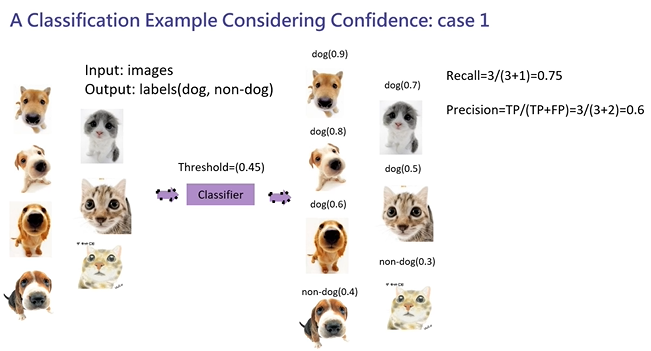
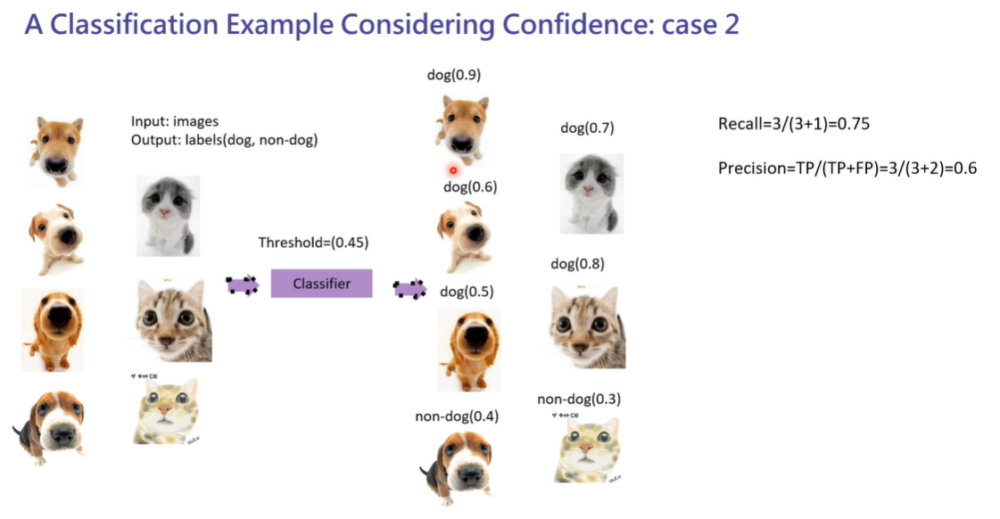
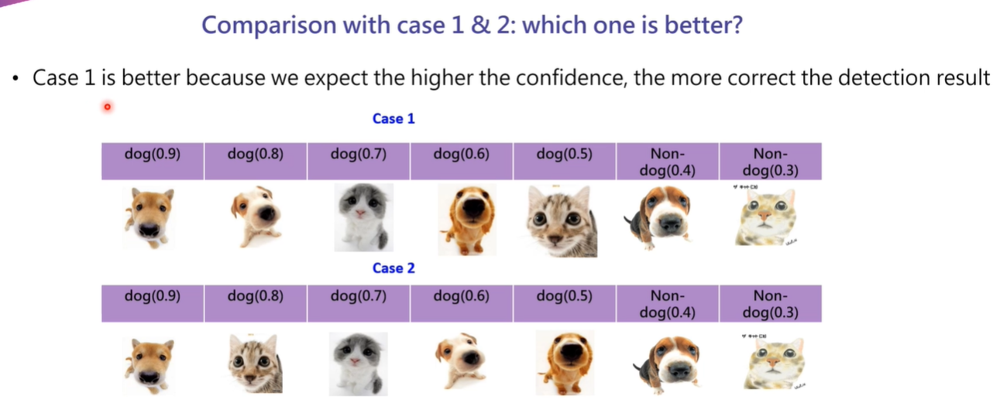
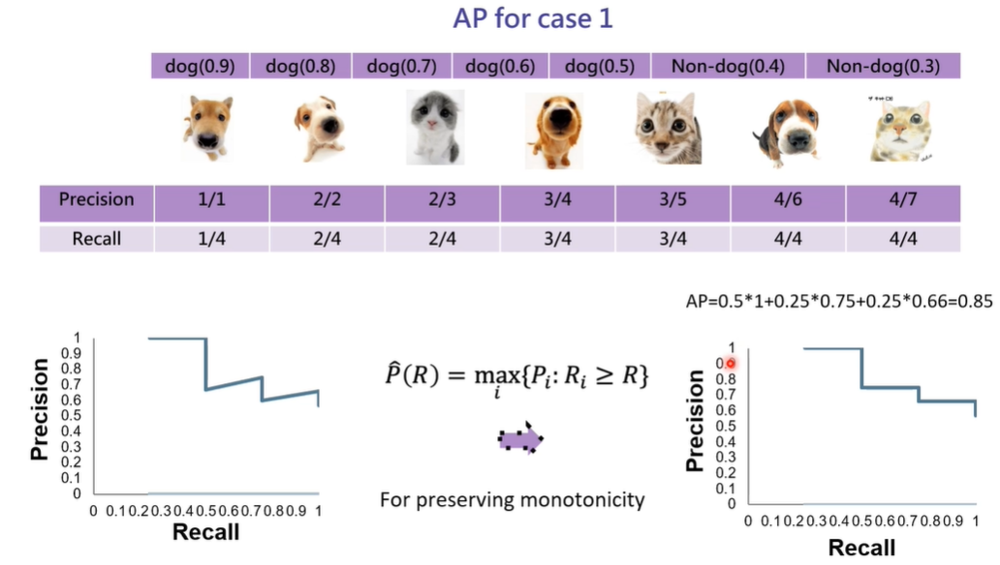
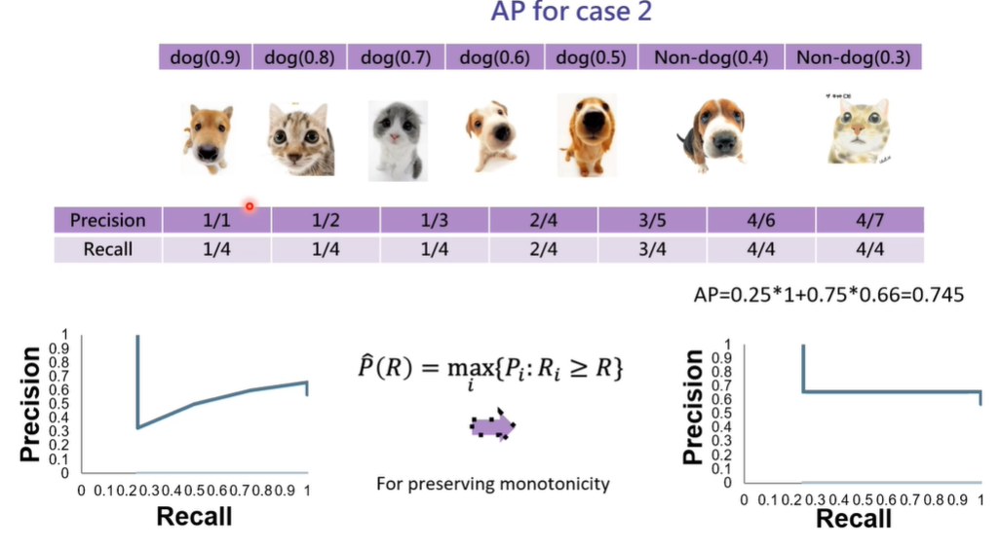

...
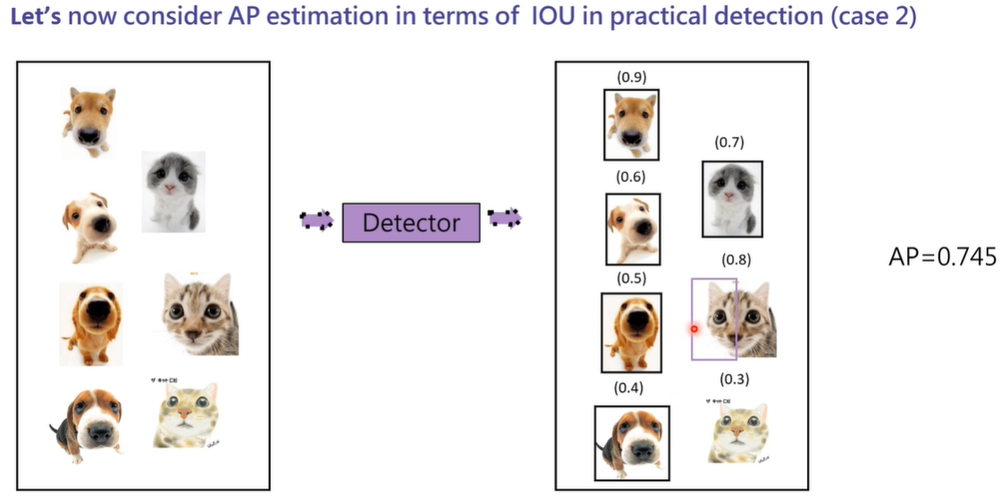
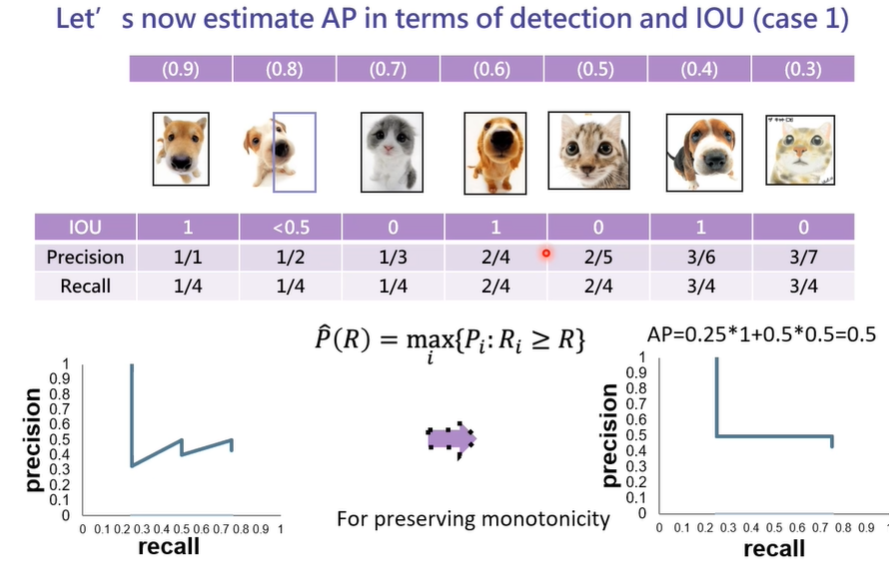
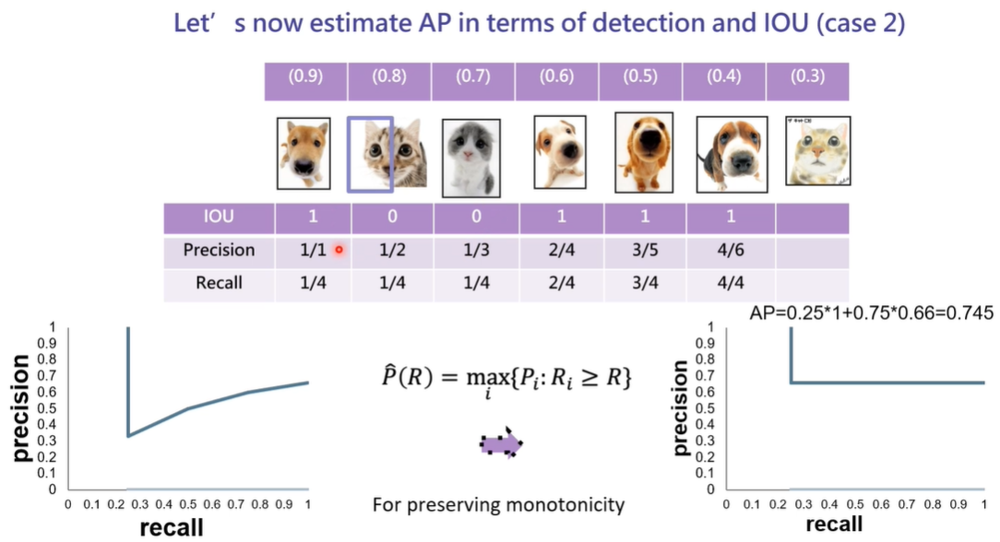

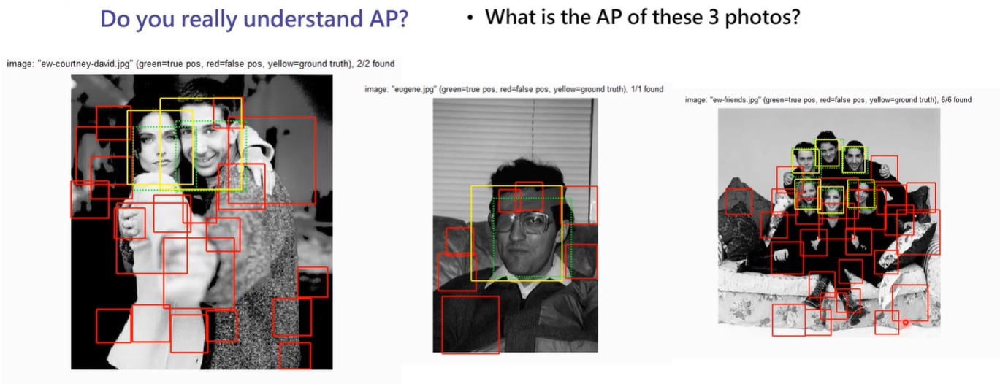

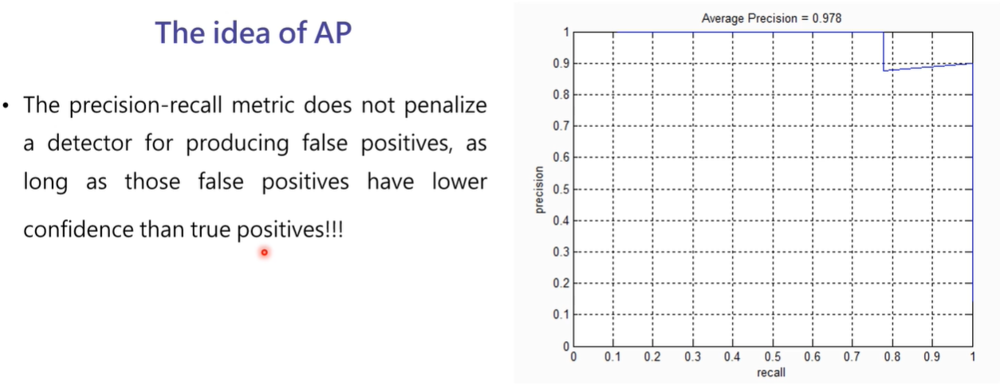
* 找一個Threshold ，可以減少判錯的red region

### 2-4 Average Precision 實作練習: 比較不同偵測結果下的AP

* AP estimation[͵ɛstəˋmeʃən]評價 <br>
Example: https://tinyurl.com/yx9k7cjl<br>
Can you explain why the following AP is achieved[əˋtʃiv]實現 in each case<br>
為什麼最後一個 AP = 0.83 ，最後一個圖，左上角的狗有一個0.95 和0.9 的Region，0.95 is TP，但是0.9被視為FP
所以AP 分數變低
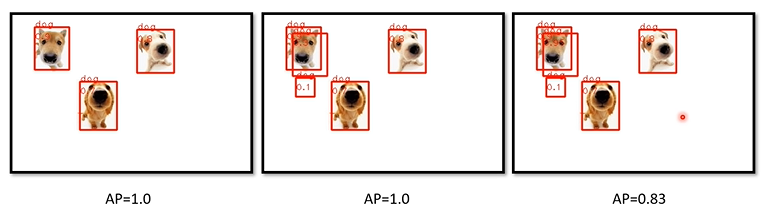        

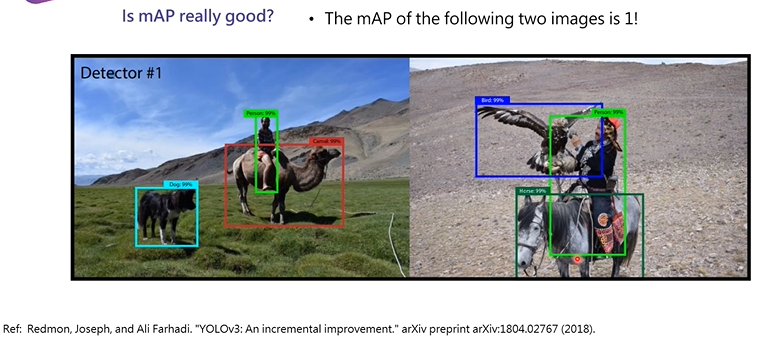
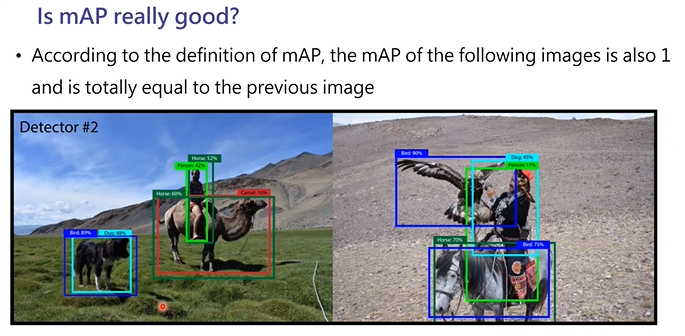
最高分是判對的(第二，第三高分是判錯的)，所以mAP =1 -> 可以提高Threshold ，去除判錯的Region
* AP & mAP 有盲點，但是現在還是主流
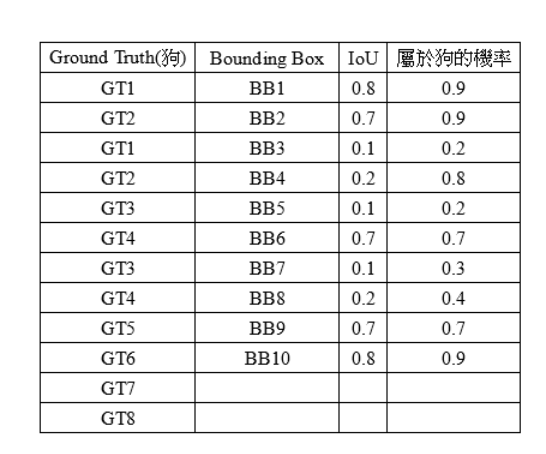
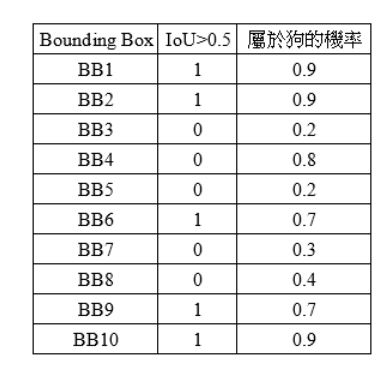
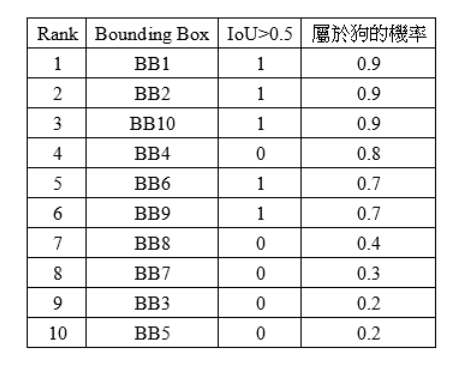
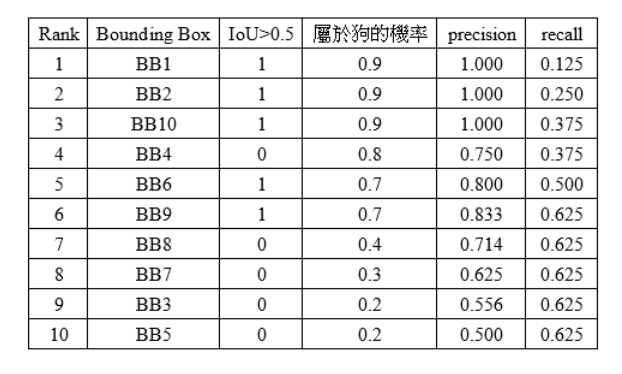
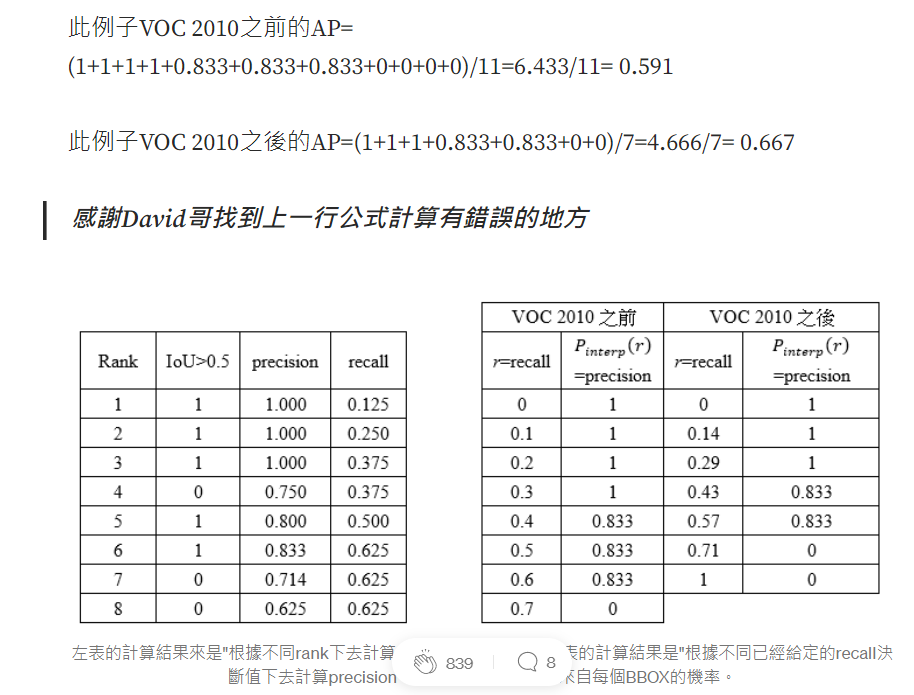
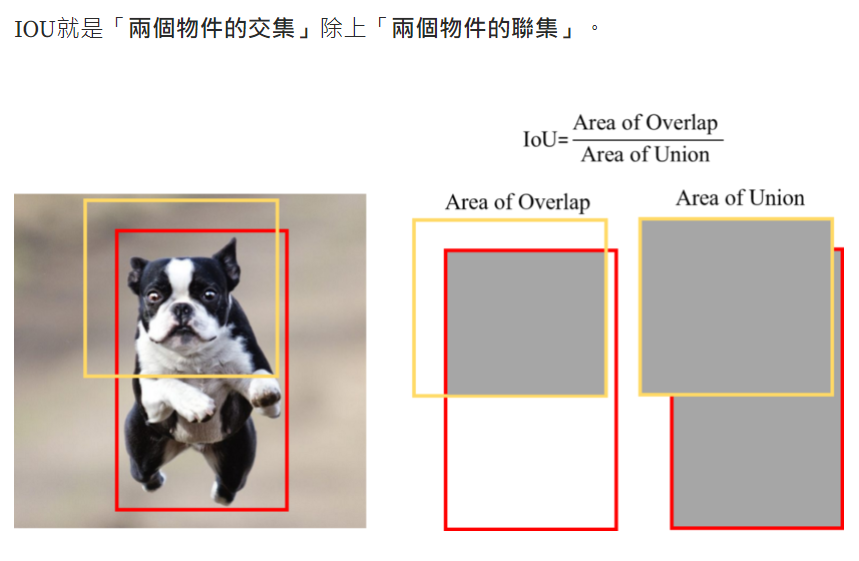
* mAP更簡單，我剛舉例是只舉一個狗的判斷，但物體偵測不可能只偵測一種東西，在COCO資料庫有80種。所以mAP就是每一種物體的AP算完後的平均值

### 在Colab 中實作 (程式碼放在Colab 上執行) =====
* first : 1:Please download the following folder, unzip it and put the entire folder in
your google drive under /content/drive/My Drive/ 
* (Mika Google 雲端硬碟目錄 is /content/drive/My Drive/ )
* download 路徑: https://drive.google.com/file/d/1seusCbByJjW8Hsgl_A3PH6O8zmYzTY9s/view?usp=sharing
       <br> file name is : mAP_estimation.zip

In [ ]:
# 第一段程式碼: call function
import numpy as mp
import time
import os
import xml.etree.ElementTree as ET
import os
import pickle
import numpy as np
import cv2
## from google.colab.patches import cv2_imshow # colab Run 要用
def voc_ap(rec, prec, use_07_metric=False): # =============================================
    """ ap = voc_ap(rec, prec, [use_07_metric])
    Compute VOC AP given precision and recall.
    If use_07_metric is true, uses the
    VOC 07 11 point method (default:False).
    """
    if use_07_metric:
        # 11 point metric
        ap = 0.
        for t in np.arange(0., 1.1, 0.1):
            if np.sum(rec >= t) == 0:
                p = 0
            else:
                p = np.max(prec[rec >= t])
            ap = ap + p / 11.
    else:
        # correct AP calculation
        # first append sentinel values at the end
        mrec = np.concatenate(([0.], rec, [1.]))
        mpre = np.concatenate(([0.], prec, [0.]))
        # compute the precision envelope
        for i in range(mpre.size - 1, 0, -1):
            mpre[i - 1] = np.maximum(mpre[i - 1], mpre[i])

        # to calculate area under PR curve, look for points
        # where X axis (recall) changes value
        i = np.where(mrec[1:] != mrec[:-1])[0]

        # and sum (\Delta recall) * prec
        ap = np.sum((mrec[i + 1] - mrec[i]) * mpre[i + 1])
    return ap

def parse_rec(filename): #=========================================== 
    """ Parse a PASCAL VOC xml file """
    tree = ET.parse(filename)
    objects = []
    for obj in tree.findall('object'):
        obj_struct = {}
        obj_struct['name'] = obj.find('name').text
        obj_struct['pose'] = obj.find('pose').text
        obj_struct['truncated'] = int(obj.find('truncated').text)
        obj_struct['difficult'] = int(obj.find('difficult').text)
        bbox = obj.find('bndbox')
        obj_struct['bbox'] = [int(bbox.find('xmin').text),
                              int(bbox.find('ymin').text),
                              int(bbox.find('xmax').text),
                              int(bbox.find('ymax').text)]
        objects.append(obj_struct)
    return objects

def voc_eval(det_result, #====================================
             annopath,
             imagesetfile,
             classname,
             cachedir,
             ovthresh=0.5,
             use_07_metric=False):
    """rec, prec, ap = voc_eval(detpath,
                                annopath,
                                imagesetfile,
                                classname,
                                [ovthresh],
                                [use_07_metric])

    Top level function that does the PASCAL VOC evaluation.

    detpath: Path to detections
        detpath.format(classname) should produce the detection results file.
    annopath: Path to annotations
        annopath.format(imagename) should be the xml annotations file.
    imagesetfile: Text file containing the list of images, one image per line.
    classname: Category name (duh)
    cachedir: Directory for caching the annotations
    [ovthresh]: Overlap threshold (default = 0.5)
    [use_07_metric]: Whether to use VOC07's 11 point AP computation
        (default False)
    """
    # assumes detections are in detpath.format(classname)
    # assumes annotations are in annopath.format(imagename)
    # assumes imagesetfile is a text file with each line an image name
    # cachedir caches the annotations in a pickle file
    # first load gt
    if not os.path.isdir(cachedir):
        os.mkdir(cachedir)
    cachefile = os.path.join(cachedir, 'annots.pkl')
    # read list of images
    with open(imagesetfile, 'r') as f:
        lines = f.readlines()
        #print(lines)
    imagenames = [x.strip() for x in lines]
    if not os.path.isfile(cachefile):
        # load annots
        recs = {}
        for i, imagename in enumerate(imagenames):
            recs[imagename] = parse_rec(annopath.format(imagename))
            if i % 100 == 0:
                print('Reading annotation for {:d}/{:d}'.format(
                    i + 1, len(imagenames)))
        # save
        print('Saving cached annotations to {:s}'.format(cachefile))
        with open(cachefile, 'wb') as f:
            pickle.dump(recs, f)
    else:
        # load
        with open(cachefile, 'rb') as f:
            recs = pickle.load(f)
    # extract gt objects for this class
    class_recs = {}
    npos = 0
    for imagename in imagenames:
        R = [obj for obj in recs[imagename] if obj['name'] == classname]
        bbox = np.array([x['bbox'] for x in R])
        difficult = np.array([x['difficult'] for x in R]).astype(np.bool)
        det = [False] * len(R)
        npos = npos + sum(~difficult)
        class_recs[imagename] = {'bbox': bbox,
                                 'difficult': difficult,
                                 'det': det}
    # read dets
    #with open(detfile, 'r') as f:
    #    lines = f.readlines()
    lines = det_result
    # using "__" instead of " " because the data path under Google drive is all "/content/drive/My Drive/...
    # Therefore, the following .split(' ') function would result in error
    #splitlines = [x.strip().split('__') for x in lines]
    splitlines = [x.strip().split(' ') for x in lines]
    image_ids = [x[0] for x in splitlines]
    confidence = np.array([float(x[1]) for x in splitlines])
    BB = np.array([[float(z) for z in x[2:]] for x in splitlines])
    # sort by confidence
    sorted_ind = np.argsort(-confidence)
    sorted_scores = np.sort(-confidence)
    BB = BB[sorted_ind, :]
    image_ids = [image_ids[x] for x in sorted_ind]
    # go down dets and mark TPs and FPs
    nd = len(image_ids)
    tp = np.zeros(nd)
    fp = np.zeros(nd)
    for d in range(nd):
        R = class_recs[image_ids[d]]
        bb = BB[d, :].astype(float)
        ovmax = -np.inf
        BBGT = R['bbox'].astype(float)

        if BBGT.size > 0:
            # compute overlaps
            # intersection
            ixmin = np.maximum(BBGT[:, 0], bb[0])
            iymin = np.maximum(BBGT[:, 1], bb[1])
            ixmax = np.minimum(BBGT[:, 2], bb[2])
            iymax = np.minimum(BBGT[:, 3], bb[3])
            iw = np.maximum(ixmax - ixmin + 1., 0.)
            ih = np.maximum(iymax - iymin + 1., 0.)
            inters = iw * ih

            # union
            uni = ((bb[2] - bb[0] + 1.) * (bb[3] - bb[1] + 1.) +
                   (BBGT[:, 2] - BBGT[:, 0] + 1.) *
                   (BBGT[:, 3] - BBGT[:, 1] + 1.) - inters)

            overlaps = inters / uni
            ovmax = np.max(overlaps)
            jmax = np.argmax(overlaps)

        if ovmax > ovthresh:
            if not R['difficult'][jmax]:
                if not R['det'][jmax]:
                    tp[d] = 1.
                    R['det'][jmax] = 1
                else:
                    fp[d] = 1.
        else:
            fp[d] = 1.
    # compute precision recall
    fp = np.cumsum(fp)
    tp = np.cumsum(tp)
    rec = tp / float(npos)
    # avoid divide by zero in case the first detection matches a difficult
    # ground truth
    prec = tp / np.maximum(tp + fp, np.finfo(np.float64).eps)
    ap = voc_ap(rec, prec, use_07_metric)
    return rec, prec, ap


def _do_python_eval_quite(mAP_folder, det_result): # ================================
  # do remind only PAScal VOC 07 test needs to use use_07_metric ==  True 
  # simply replace 2007 with year bigger than 2010 will work
    _year = '2010'
    _classes = ('dog',)
    annopath = mAP_folder + '{:s}.xml'
    imagesetfile = mAP_folder + 'test.txt'
    cachedir = mAP_folder 
    aps = []
    result = dict()
    # The PASCAL VOC metric changed in 2010
    use_07_metric = True if int(_year) < 2010 else False
    print("Begin to perform mAP estimation")
    for i, cls in enumerate(_classes):
        #if cls == '__background__':
        #    continue
        #print(cls)
        rec, prec, ap = voc_eval(
            det_result, annopath, imagesetfile, cls, cachedir, ovthresh=0.5,
            use_07_metric=use_07_metric)
        aps += [ap]
        # print('AP for {} = {:.4f}'.format(cls, ap))
        result[cls] = ap
        # the following file (rec, prec, & ap of each class) is only for back-up.
        #with open(os.path.join(output_dir, cls + '_pr.pkl'), 'wb') as f:
        #    pickle.dump({'rec': rec, 'prec': prec, 'ap': ap}, f)
    return result    

def plot_boxes_cv2(img, boxes, class_names=None, color=None): # ======================
    width = img.shape[1]
    height = img.shape[0]    
    #print(len(boxes))
    for box in boxes:
        x1 = box.split(' ')[2]
        y1 = box.split(' ')[3]
        x2 = box.split(' ')[4]
        y2 = box.split(' ')[5]
        x1,x2 = int(float(x1)),int(float(x2))
        y1,y2 = int(float(y1)),int(float(y2))
        #cls_id = int(detection_classses[j,0])
        #prob = float(boxes[j,1])
        prob = float(box.split(' ')[1])
        #print(prob)
        #img = cv2.putText(img, 'dog', (x1,y1),  cv2.FONT_HERSHEY_PLAIN, 1.0, (0,0,255), thickness=1)
        #img = cv2.putText(img, str(round(prob,3)), (x1,y1+20),  cv2.FONT_HERSHEY_PLAIN, 1.0, (0,0,255), thickness=1)
        #img = cv2.rectangle(img, (x1,y1), (x2,y2), (0, 0, 255), 2)
        img = cv2.rectangle(img, (x1,y1), (x2,y2), (0, 255, 0), 2)
        img = cv2.rectangle(img, (x1,y1), (x2,y1+15), (255, 255, 255), -1)
        #resized_image = cv2.putText(resized_image, ' %s: %.2f' % (classes[cls_id],prob) , (x1-5,y1+10),  cv2.FONT_HERSHEY_COMPLEX_SMALL , 11, (0,0,0), thickness=1)
        img = cv2.putText(img, '%s:%.2f' % ('dog',prob) , (x1,y1+13),  cv2.FONT_HERSHEY_COMPLEX_SMALL , 1, (0,0,0), thickness=1)
    return img

In [ ]:
# 第二段 主程式 (in colab run)
from google.colab import drive
drive.mount('/content/drive')


# step 1:Please download the following folder, unzip it and put the entire folder in your google drive under /content/drive/My Drive/
# https://drive.google.com/file/d/1seusCbByJjW8Hsgl_A3PH6O8zmYzTY9s/view?usp=sharing


mAP_folder = "/content/drive/My Drive/mAP_estimation/"
img_file = "/content/drive/My Drive/mAP_estimation/000001.jpg"

# orignal setting: simulating detection results in the following list; the format is filename, confidence, x1, y1, x2, y2 row-wise
det_result = ['000001 0.9 35.0 19.0 90.0 87.0', '000001 0.8 198.0 23.0 257.0 92.0', '000001 0.7 107.0 106.0 166.0 183.0']
# new setting-1:
#det_result = ['000001 0.9 35.0 19.0 90.0 87.0', '000001 0.8 198.0 23.0 257.0 92.0', '000001 0.7 107.0 106.0 166.0 183.0','000001 0.1 50.0 100 80.0 130.0','000001 0.3 45.0 29.0 100.0 97.0']
# new setting-2:
#det_result = ['000001 0.9 35.0 19.0 90.0 87.0', '000001 0.8 198.0 23.0 257.0 92.0', '000001 0.7 107.0 106.0 166.0 183.0','000001 0.1 50.0 100 80.0 130.0','000001 0.95 45.0 29.0 100.0 97.0']


# read the image
image = cv2.imread(img_file)     

# show the detection results
image = plot_boxes_cv2(image, det_result, class_names = 'dog', color=None)
cv2_imshow(image)    

# begin AP or mAP estimation
result = _do_python_eval_quite(mAP_folder, det_result)

print('The AP of class-{} is {}'.format('dog', result.get('dog')))

### 1. precision =TP/(TP+FP) = 真正判成狗的數量/全部判成狗的數量
### 2. Recall = TP/(TP+NF) =真正判成狗的數量/實際有幾條狗的數量
* AP (average precision) 算法: average precision
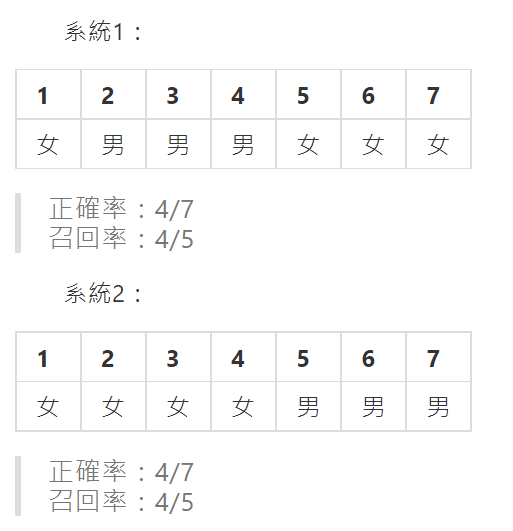
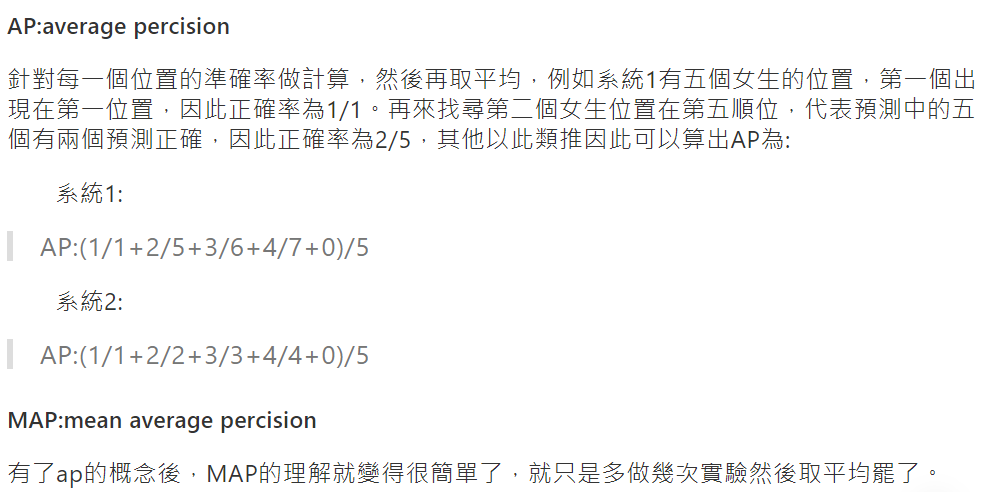

## 2.圖像辨識MAP:
上面的例子是說明在檢索方面的MAP定義，運用在object detection中卻又是不太一樣的，詳細定義在 The PASCAL Visual Object Classes (VOC) Challenge中，裡面的MAP稱做11-point interpolated average precision，計算方式如下:
首先針對算法畫出PR曲線，然後根據下列公式計算出AP，r代表recall，p代表precision，意思就是說找出recall大於某一個閥值(ex:0.3)的最大準確率，總共有11個要找，閥值分別為0、0.1…1，全部找到後取平均就是每一類的AP，而MAP即是對所有分類都做一次求AP的動作然後再取平均。
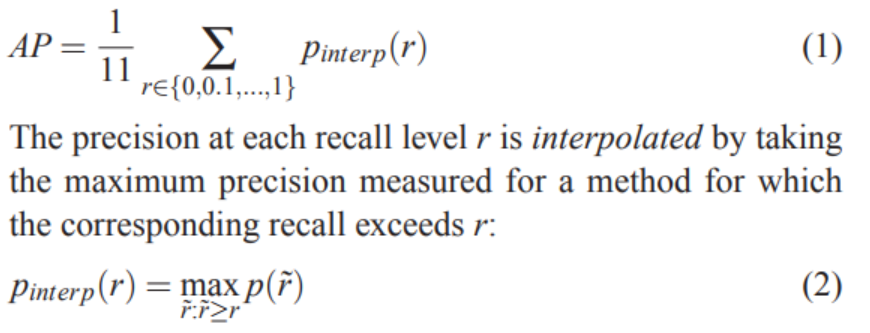
下面舉一個例子說明
這例子來自[3]，假設已訓練好一個分類器(ex:car)，用20個測試樣本評估後效果如下，gt_label為1表示測試樣本中有車，反之沒有，score代表分類器預測出的機率，右圖是將順序依照機率大小排列。
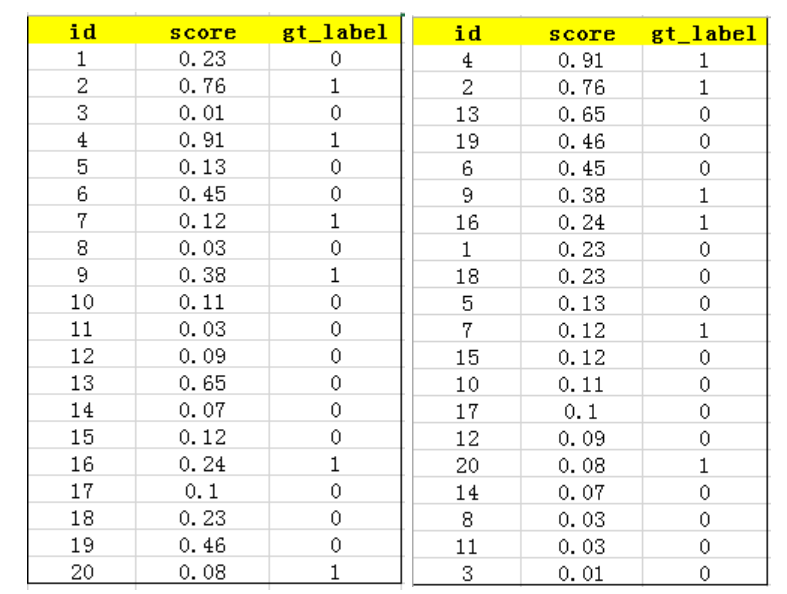
如果以top-5來當分水嶺可以得到下圖，其中4、2就代表TP，13、19、6代表FP，top-5之後的就代表TN和FN。
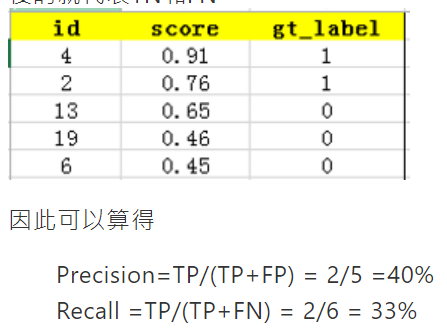
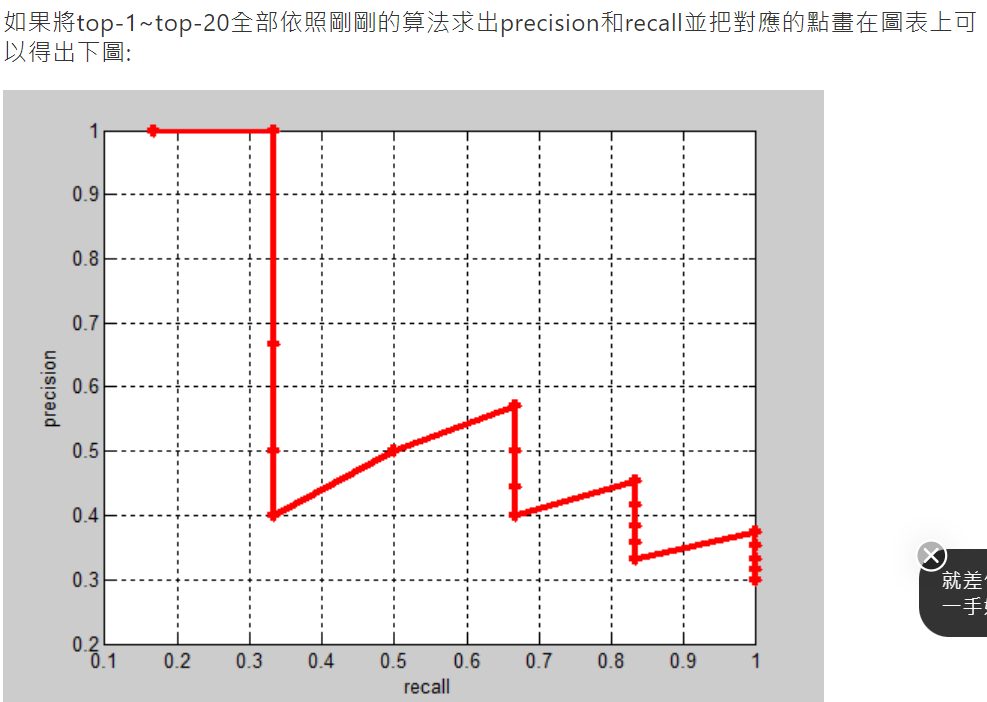
接下來針對每一個recall點(0~1，共11個)找出最大機率
1.r>=0:maxp=1
2.r>=0.1:maxp=1
3.r>=0.2:maxp=1
4.r>=0.3:maxp=1
5.r>=0.4:maxp=4/7=0.57
6.r>=0.5:maxp=4/7=0.57
7.r>=0.6:maxp=4/7=0.57
8.r>=0.7:maxp=5/11=0.45
9.r>=0.8:maxp=5/11=0.45
10.r>=0.9:maxp=6/16=0.375
11.r>=1:maxp=6/16=0.375

因此 AP = (4X1+3X4/7+2X5/11+2X6/16)/11=0.67

後來又換了一種新的算法，新的算法將recall的區間從(0、0.1…1)換成了(1/M、2/M、…M/M)共有M個，因此新的算法可以圖解如下:
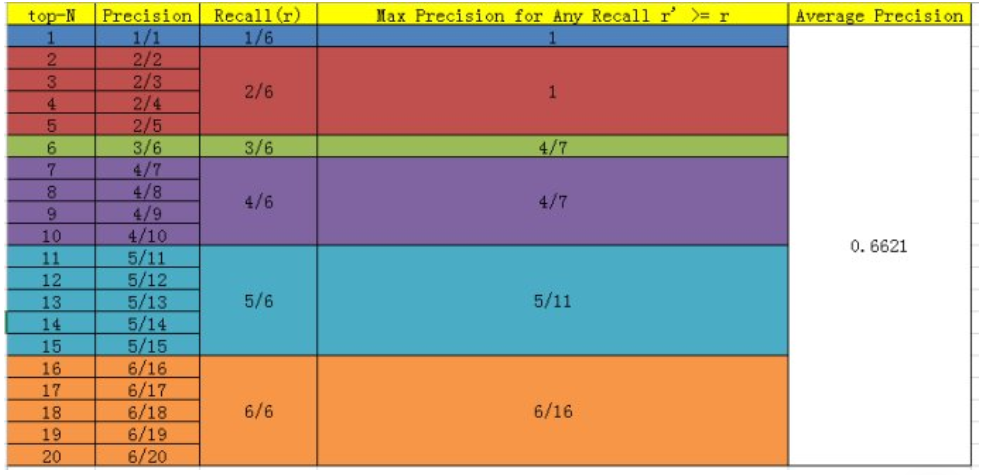
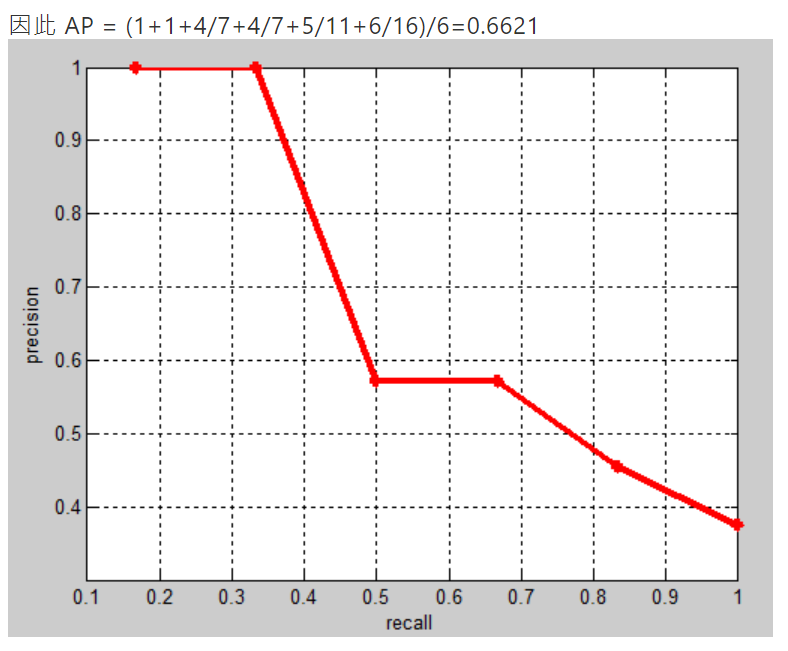
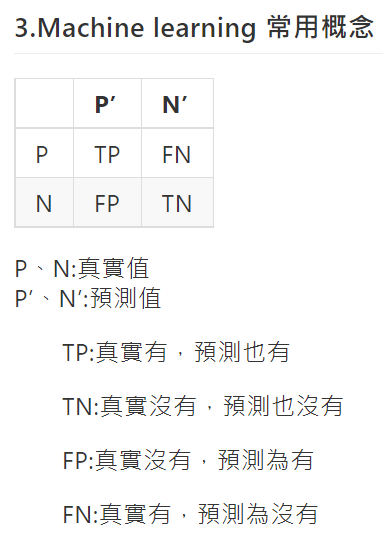
Sensitivity(true positive rate)　or recall
真實有的數量占全部有的數量比例
TPR = TP/(TP+FN)

False alarm rate(false positive rate)
判斷成有的數量占全部沒有數量的比例
FPR = FP/(FP+TN)

Accuracy
判斷正確占全部數據的比例
ACC = (TP+TN)/(P+N)

Precision:
真實有的數量占全部判斷成有數量的比例
Precision=TP/(TP+FP)

###  2-5 何謂非極值抑制 （Non Maximal Suppression）？
* Boxes with lower confidence and IOU <0.5 with the one with higher confidence should be eliminated. (lower confidence eliminated)
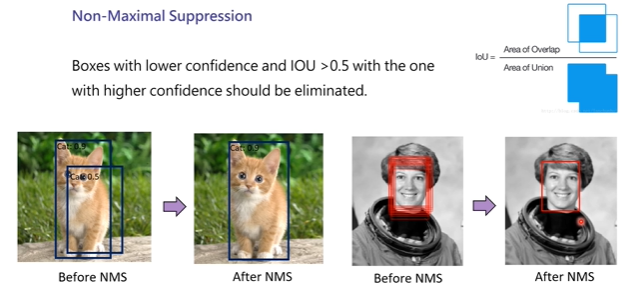
* soft NMS : 克服 when different instances of the class of object are overlapping.
找分數高的(不刪除第二高，高分都保留)
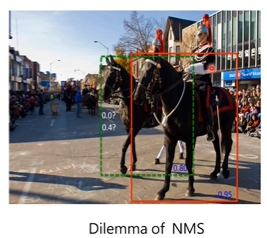

### 2-6 Non-Maximal Suppression implementation(實作)
* NMS example: https://tinyurl.com/2p8e7czv
* However, in this example, the final bbox is the weighted bboxes corresponding to
the one with the highest confidence. (使用所有位置算加權平均。get 最佳解)
* Can you modify the script not to re-weight the final bbox?
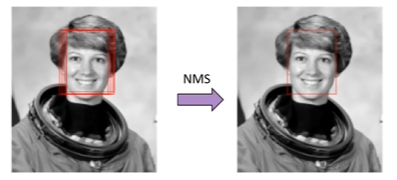

### 補充資料 : skimage庫子模組介紹
* skimage庫的全稱scikit-image Scikit， 是對scipy.ndimage進行了擴充套件，提供了更多的圖片處理功能。skimage包含很多的子模組，各個子模組具有不同的功能，如下

* 子模組名稱	                   實現功能
* io	                       讀取,儲存和顯示圖片和視訊
* color	                       顏色空間變換
* data	                       提供一些測試圖片和樣本資料
* filters	                   影象增強，邊緣檢測，排序濾波器，自動閾值等
* draw	操                     作於numpy陣列上的基本圖形繪製，包括線條，矩陣，圓和文字等
* transform	                   幾何變換和其他變換，如旋轉，拉伸和Radon(拉東)變換等
* exposure	                   影象強度調整，例如，直方圖均衡化等
* feature	                   特徵檢測和提取， 例如，紋理分析等
* graph	                       圖論操作，例如，最短路徑
* measure	                   影象屬性測量，例如，相似度和輪廓
* morphology	               形態學操作，如開閉運算，骨架提取等
* novice	                   簡化的用於教學目的的介面
* restoration	               修復演算法，例如去卷積演算法，去噪等
* segmentation	               影象分割為多個區域
* util	                       通用工具
* viewer	                   簡單圖形使用者介面用於視覺化結果和探索引數
from skimage import io, data, feature

In [ ]:
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
from skimage import io
from skimage import data
from skimage.color import rgb2gray

img = io.imread("000001.jpg")
print(img.shape)
io.imshow(img)
io.show()

grayscale = rgb2gray(img)
print(grayscale.shape)
io.imshow(grayscale)
io.show()

# plt.imshow(img)
# plt.show()

In [ ]:
from skimage import io, data
img = data.hubble_deep_field()
io.imshow(img)
io.show()

from skimage import data_dir
print (data_dir)

io.imsave('hubble_deep_field.jpg', img)

In [ ]:
# 獲取圖片資訊
from skimage import io, data

img = data.chelsea()
io.imshow(img)
io.show()

print(type(img))    # 型別
print(img.shape)    # 形狀
print(img.shape[0]) # 圖片寬度
print(img.shape[1]) # 圖片高度
print(img.shape[2]) # 圖片通道數
print(img.size)     # 顯示總畫素個數
print(img.max())    # 最大畫素值
print(img.min())    # 最小畫素值
print(img.mean())   # 畫素平均值

#### 畫素讀取 :
* color image:  img[i, j, c] : i 表示圖片的行數 j 表示圖片的列數 
c 表示圖片的通道數(RGB三通道分別對應0, 1, 2)。
* gray image: gray[i, j]

In [ ]:
from skimage import io, data

img = data.astronaut()
pixel = img[20, 10, 2]
print(pixel)

In [ ]:
from skimage import io, data

img = data.astronaut()
# R = img[:, :, 0]
G = img[:, :, 1]
# B = img[:, :, 2]
io.imshow(R)
io.show()

In [ ]:
from skimage import io, data
import numpy as np

img = data.astronaut()

# 隨機生成5000個椒鹽點
rows, cols, dims = img.shape
print(rows, cols, dims)
for i in range(5000):
    x = np.random.randint(0, rows)
    y = np.random.randint(0, cols)
    img[x, y, :] = 255

io.imshow(img)
io.show()

In [ ]:
from skimage import io, data

img = data.astronaut()
partial_img = img[50:150, 170:270, :]

io.imshow(partial_img)
io.show()

In [ ]:
from skimage import io, data, color

img = data.astronaut()

img_gray = color.rgb2gray(img)
rows, cols = img_gray.shape

for i in range(rows):
    for j in range(cols):
        if (img_gray[i, j] <= 0.6):
            img_gray[i, j] = 0
        else:
            img_gray[i, j] = 1
io.imshow(img_gray)
io.show()

In [ ]:
from skimage import io, data, color

img = data.coffee()
hsv = color.convert_colorspace(img, 'RGB', 'HSV')
io.imshow(hsv[:, :, 0])
io.show()

### 1. Read the sample image and overlap the bboxes 

 color image -------------------------------------------


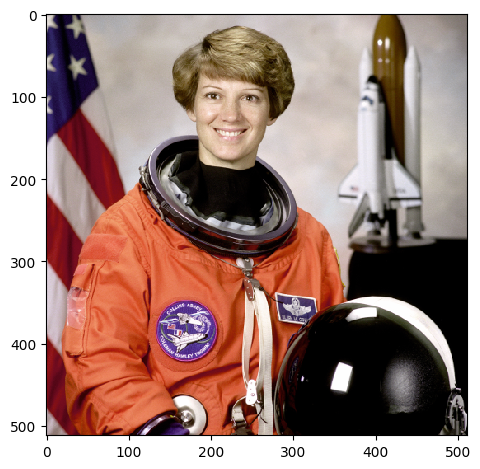

 gray image -------------------------------------------


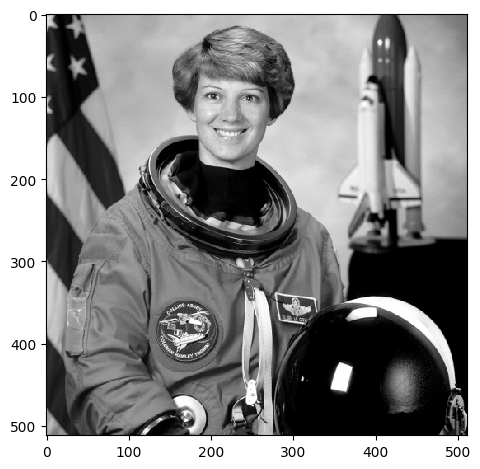

 按比例缩放rescale 0.5-------------------------------------------


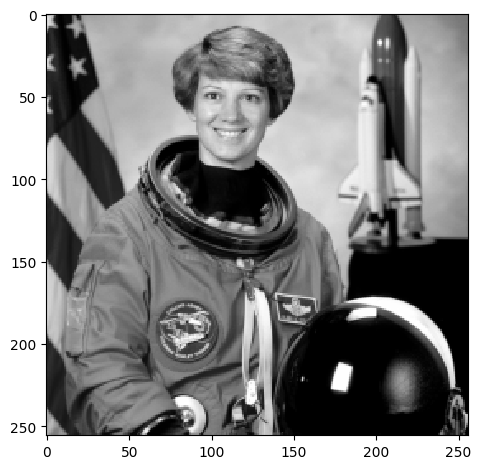

 image (0~160 ,40~180) = (160*140)------------------------------


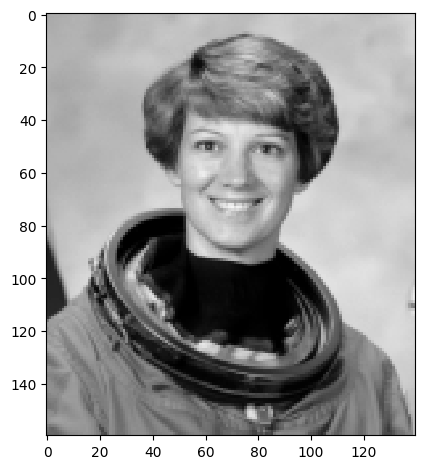

 -plt.imshow(test_image, cmap='gray')----------------------------


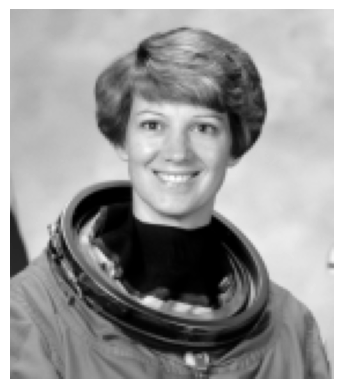

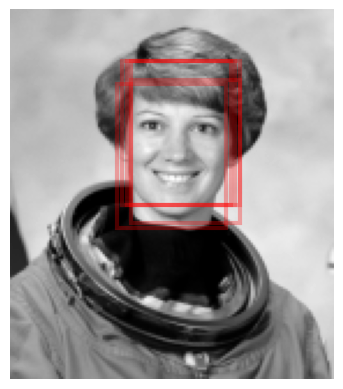

In [7]:
# RUN IN Colab
import matplotlib.pyplot as plt
import skimage
import numpy as np
from skimage import data, transform
import torch
from skimage import io

test_image = skimage.data.astronaut()
print(" color image -------------------------------------------")
io.imshow(test_image)
io.show()
print(" gray image -------------------------------------------")
test_image = skimage.color.rgb2gray(test_image)
io.imshow(test_image)
io.show()
print(" 按比例缩放rescale 0.5-------------------------------------------")
test_image = skimage.transform.rescale(test_image, 0.5) # 按比例缩放rescale 0.5
io.imshow(test_image)
io.show()
print(" image (0~160 ,40~180) = (160*140)------------------------------")
test_image = test_image[:160, 40:180]
io.imshow(test_image)
io.show()
print(" -plt.imshow(test_image, cmap='gray')----------------------------")
plt.imshow(test_image, cmap='gray')
plt.axis('off');

# overlapping bounding boxes as well as store raw detection results

fig, ax = plt.subplots()
ax.imshow(test_image, cmap='gray')
ax.axis('off')

# Selected detection bboxes from the HOG+SVM face detection examples; bboxes are in x1,y1,x2,y2 format
BBoxes = np.array([[ 52, 30,  99,  92, 0.142],  [ 46,  32,  93,  94, 0.587],  [ 48,  22,  95,  84, 0.433],  [ 50,  22,  97,  84, 0.215],  [ 52,  22,  99,  84, 0.345] ])
#print(BBoxes.shape)

# overlapping the bboxes
for BBOX in BBoxes:  
    ax.add_patch(plt.Rectangle((BBOX[0], BBOX[1]), BBOX[2]-BBOX[0], BBOX[3]-BBOX[1], edgecolor='red', alpha=0.3, lw=3, facecolor='none'))


### 2. Apply Non-Maximal-Suppression for eliminating[ɪˋlɪmə͵net] 消除multiple多個/redundantadj.多餘的 outputs:

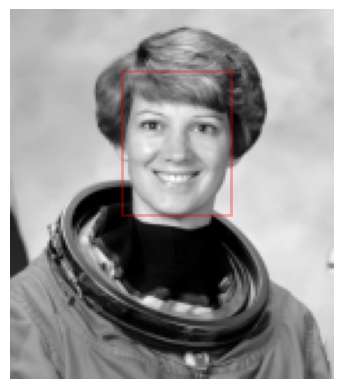

In [8]:
def bbox_iou(box1, box2):
    """
    Returns the IoU of two bounding boxes
    """
    # Get the coordinates of bounding boxes
    b1_x1, b1_y1, b1_x2, b1_y2 = box1[:, 0], box1[:, 1], box1[:, 2], box1[:, 3]
    b2_x1, b2_y1, b2_x2, b2_y2 = box2[:, 0], box2[:, 1], box2[:, 2], box2[:, 3]
    # get the corrdinates of the intersection rectangle
    row_num = b2_x1.shape[0]
    
    b1_x1 = np.repeat(b1_x1, repeats=row_num, axis=0)
    b1_y1 = np.repeat(b1_y1, repeats=row_num, axis=0)
    b1_x2 = np.repeat(b1_x2, repeats=row_num, axis=0)
    b1_y2 = np.repeat(b1_y2, repeats=row_num, axis=0)


    inter_rect_x1 = np.max([b1_x1, b2_x1])
    inter_rect_y1 = np.max([b1_y1, b2_y1])
    inter_rect_x2 = np.min([b1_x2, b2_x2])
    inter_rect_y2 = np.min([b1_y2, b2_y2])
    # Intersection area
    inter_area = np.clip(inter_rect_x2 - inter_rect_x1 + 1, 0, inter_rect_x2 - inter_rect_x1 + 1) * np.clip( inter_rect_y2 - inter_rect_y1 + 1, 0, inter_rect_y2 - inter_rect_y1 + 1)
    # Union Area
    b1_area = (b1_x2 - b1_x1 + 1) * (b1_y2 - b1_y1 + 1)
    b2_area = (b2_x2 - b2_x1 + 1) * (b2_y2 - b2_y1 + 1)


    iou = inter_area / (b1_area + b2_area - inter_area + 1e-16)
    
    return iou


def non_max_suppression(prediction, conf_thres=0.3, nms_thres=0.4):
    """
    Removes detections with lower object confidence score than 'conf_thres' and performs
    Non-Maximum Suppression to further filter detections.
    Returns detections with shape:
        (x1, y1, x2, y2, class_score)
    """
        
    for image_i, image_pred in enumerate(prediction):
        
        # Filter out confidence scores below threshold
        image_pred = image_pred[image_pred[:, 4] >= conf_thres]        
        # score is used to sort examples
        score = image_pred[:, 4] 
        # Sort by it
        image_pred = image_pred[(-score).argsort()]


        detections = image_pred[:, :5].copy()

        # Perform non-maximum suppression
        keep_boxes = []
        while detections.size>0:          
            large_overlap = bbox_iou(np.expand_dims(detections[0, :4], axis=0), detections[:, :4]) > nms_thres            
          
            # Indices of boxes with lower confidence scores, large IOUs and matching labels
            invalid = large_overlap #
            weights = detections[invalid, 4:5]          
            # Merge overlapping bboxes by order of confidence
            detections[0, :4] = (weights * detections[invalid, :4]).sum(0) / weights.sum()
            keep_boxes += [detections[0]]
            detections = detections[~invalid]



    return keep_boxes


# expand the dimension because normally, the 1st dimension is batch. however, there is only 1 image in this example
BBoxes = np.expand_dims(BBoxes, axis=0)
output = non_max_suppression(BBoxes, conf_thres=0.3, nms_thres=0.4)   
#print(output)

fig, ax = plt.subplots()
ax.imshow(test_image, cmap='gray')
ax.axis('off')

for BBOX in output:
  #print(BBOX[0])
  # plt.Rectangle((x, y), w, h,...)       
    ax.add_patch(plt.Rectangle((BBOX[0], BBOX[1]), BBOX[2]-BBOX[0], BBOX[3]-BBOX[1], edgecolor='red', alpha=0.3, lw=2, facecolor='none'))